<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Import Libraries</h2>
</div>


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.utils import resample
import pickle
import warnings
warnings.filterwarnings("ignore")

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Read Data</h2>
</div>


In [2]:
df = pd.read_csv('/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Data/Raw/pistachio.csv')

In [3]:
df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,305.0946,0.9424,77579,0.7710,2.0319,0.6806,0.6896,0.0061,0.0030,0.4756,0.9664,Kirmizi_Pistachio
1,89272,1173.1810,460.2551,251.9546,0.8369,337.1419,0.9641,92598,0.7584,1.8267,0.8151,0.7325,0.0052,0.0028,0.5366,0.9802,Siit_Pistachio
2,60955,999.7890,386.9247,209.1255,0.8414,278.5863,0.9465,64400,0.7263,1.8502,0.7663,0.7200,0.0063,0.0034,0.5184,0.9591,Kirmizi_Pistachio
3,79537,1439.5129,466.7973,221.2136,0.8806,318.2289,0.9437,84281,0.7568,2.1102,0.4823,0.6817,0.0059,0.0028,0.4648,0.9807,Kirmizi_Pistachio
4,96395,1352.6740,515.8730,246.5945,0.8784,350.3340,0.9549,100950,0.7428,2.0920,0.6620,0.6791,0.0054,0.0026,0.4612,0.9648,Kirmizi_Pistachio


<center>
<table style="direction: rtl;line-height: 200%; font-size: medium;">
  <tr>
    <th>Description</th>
    <th>Column</th>
  </tr>
  <tr>
    <td>The area of the pistachio region detected in the image</td>
    <td><code>AREA</code></td>
  </tr>
  <tr>
    <td>The perimeter (total length) of the pistachio region boundary</td>
    <td><code>PERIMETER</code></td>
  </tr>
  <tr>
    <td>The length of the major axis of the ellipse that best fits the pistachio region</td>
    <td><code>MAJOR_AXIS</code></td>
  </tr>
  <tr>
    <td>The length of the minor axis of the ellipse that best fits the pistachio region</td>
    <td><code>MINOR_AXIS</code></td>
  </tr>
  <tr>
    <td>The eccentricity of the ellipse that describes the elongation of the pistachio region</td>
    <td><code>ECCENTRICITY</code></td>
  </tr>
  <tr>
    <td>The equivalent diameter of the pistachio region</td>
    <td><code>EQDIASQ</code></td>
  </tr>
  <tr>
    <td>The ratio of the pistachio region's area to the area of its convex hull</td>
    <td><code>SOLIDITY</code></td>
  </tr>
  <tr>
    <td>The area of the convex hull of the pistachio region</td>
    <td><code>CONVEX_AREA</code></td>
  </tr>
  <tr>
    <td>The ratio of the area of the pistachio region to the area of the bounding box that encloses it</td>
    <td><code>EXTENT</code></td>
  </tr>
  <tr>
    <td>The ratio of the major axis length to the minor axis length, indicating the shape of the pistachio region</td>
    <td><code>ASPECT_RATIO</code></td>
  </tr>
  <tr>
    <td>A measure of how closely the pistachio region resembles a perfect circle (circularity)</td>
    <td><code>ROUNDNESS</code></td>
  </tr>
  <tr>
    <td>A measure of how compact the shape of the pistachio region is</td>
    <td><code>COMPACTNESS</code></td>
  </tr>
  <tr>
    <td>Shape factor 1, a geometric descriptor calculated from the area and perimeter of the pistachio region</td>
    <td><code>SHAPEFACTOR_1</code></td>
  </tr>
  <tr>
    <td>Shape factor 2, another geometric descriptor calculated from the area and perimeter of the pistachio region</td>
    <td><code>SHAPEFACTOR_2</code></td>
  </tr>
  <tr>
    <td>Shape factor 3, a geometric descriptor derived from the area and perimeter of the pistachio region</td>
    <td><code>SHAPEFACTOR_3</code></td>
  </tr>
  <tr>
    <td>Shape factor 4, another geometric descriptor derived from the area and perimeter of the pistachio region</td>
    <td><code>SHAPEFACTOR_4</code></td>
  </tr>
  <tr>
    <td>The class or category of the pistachio</td>
    <td><code><b>Class [target variable]</b></code></td>
  </tr>
</table>
</center>


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Explore Data</h2>
</div>


In [4]:
row, col = df.shape
print("This Dataset have",row,"rows and",col,"columns.")

This Dataset have 1718 rows and 17 columns.


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1718 entries, 0 to 1717
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           1718 non-null   int64  
 1   PERIMETER      1718 non-null   float64
 2   MAJOR_AXIS     1718 non-null   float64
 3   MINOR_AXIS     1718 non-null   float64
 4   ECCENTRICITY   1718 non-null   float64
 5   EQDIASQ        1718 non-null   float64
 6   SOLIDITY       1718 non-null   float64
 7   CONVEX_AREA    1718 non-null   int64  
 8   EXTENT         1718 non-null   float64
 9   ASPECT_RATIO   1718 non-null   float64
 10  ROUNDNESS      1718 non-null   float64
 11  COMPACTNESS    1718 non-null   float64
 12  SHAPEFACTOR_1  1718 non-null   float64
 13  SHAPEFACTOR_2  1718 non-null   float64
 14  SHAPEFACTOR_3  1718 non-null   float64
 15  SHAPEFACTOR_4  1718 non-null   float64
 16  Class          1718 non-null   object 
dtypes: float64(14), int64(2), object(1)
memory usage: 22

In [6]:
df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000
mean,79871.952852,1421.797588,446.206444,238.193128,0.840347,317.790000,0.940103,84947.671129,0.716055,1.899342,0.570831,0.712841,0.005704,0.003017,0.510097,0.955185
std,12968.217051,373.408835,31.885328,30.426445,0.049026,26.571699,0.050006,13081.742551,0.052534,0.241253,0.211514,0.044230,0.000810,0.000334,0.063391,0.051735
min,29808.000000,858.363000,321.425500,133.509600,0.504900,194.814600,0.588000,37935.000000,0.427200,1.158500,0.062800,0.476000,0.004000,0.002400,0.226600,0.620400
25%,71898.500000,1169.633225,426.554100,217.875475,0.817500,302.562375,0.920250,76357.750000,0.688100,1.736325,0.372325,0.682000,0.005200,0.002800,0.465125,0.944200
50%,79795.000000,1260.785500,448.453150,235.888750,0.850250,318.744650,0.953800,84973.000000,0.726100,1.899550,0.643850,0.709750,0.005600,0.003000,0.503750,0.972800
75%,88980.000000,1599.479000,467.515200,257.433625,0.875375,336.590000,0.976300,93660.750000,0.753600,2.068575,0.744450,0.741600,0.006100,0.003200,0.549975,0.986800
max,124008.000000,2755.049100,535.642200,383.046100,0.946000,397.356100,0.995100,132478.000000,0.820400,3.085800,0.933600,0.869500,0.013100,0.005300,0.756100,0.999000


In [7]:
df.describe(include = "object")

,Class
count,1718
unique,2
top,Kirmizi_Pistachio
freq,998


In [8]:
df.isna().sum()

AREA             0
PERIMETER        0
MAJOR_AXIS       0
MINOR_AXIS       0
ECCENTRICITY     0
EQDIASQ          0
SOLIDITY         0
CONVEX_AREA      0
EXTENT           0
ASPECT_RATIO     0
ROUNDNESS        0
COMPACTNESS      0
SHAPEFACTOR_1    0
SHAPEFACTOR_2    0
SHAPEFACTOR_3    0
SHAPEFACTOR_4    0
Class            0
dtype: int64

In [9]:
print("Number of duplicate values : ",df.duplicated().sum())

Number of duplicate values :  0


In [10]:
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
       'SHAPEFACTOR_3', 'SHAPEFACTOR_4', 'Class'],
      dtype='object')

In [11]:
df['Class'].unique()

array(['Kirmizi_Pistachio', 'Siit_Pistachio'], dtype=object)

In [12]:
df['Class'].value_counts()

Class
Kirmizi_Pistachio    998
Siit_Pistachio       720
Name: count, dtype: int64

In [13]:
df['Class'].value_counts().sum()

1718

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Data Visualization</h2>
</div>


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Box Plot</h2>
</div>


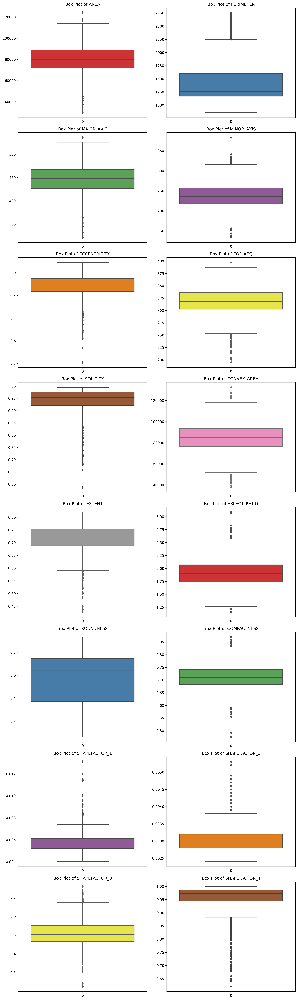

In [14]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


column_to_exclude = 'Class'

all_columns = df.columns

columns = all_columns.drop(column_to_exclude).values

num_columns = len(columns)
num_rows = (num_columns + 1) // 2

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 40),dpi = 300)

colors = sns.color_palette("Set1", num_columns)
for i, column in enumerate(columns):
    row = i // 2
    col = i % 2
    sns.boxplot(data=df[column], ax=axes[row, col], color=colors[i])
    axes[row, col].set_title(f'Box Plot of {column}')

if num_columns % 2 != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()

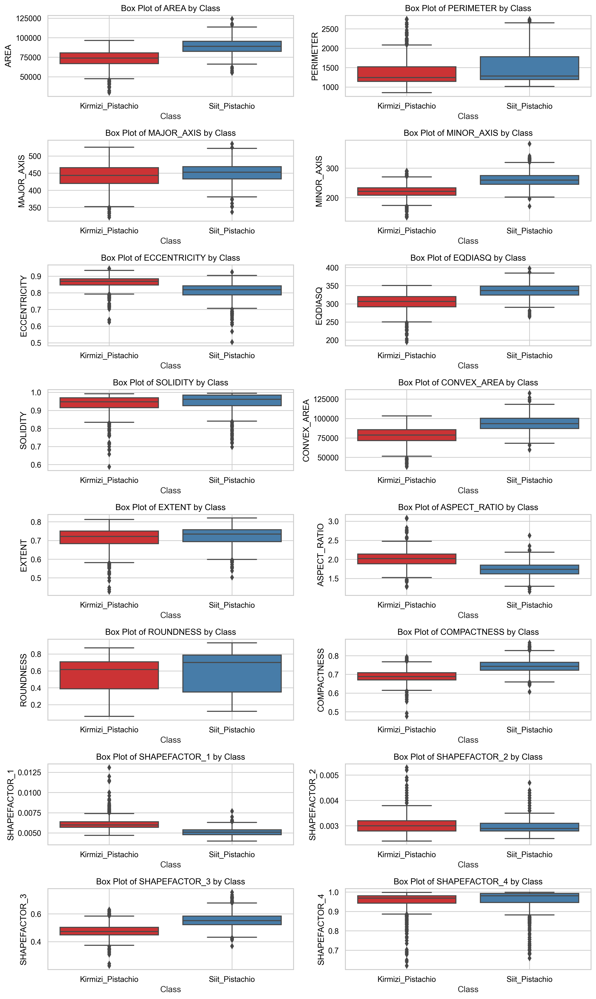

In [15]:
sns.set(style="whitegrid")

# Specify the name of the categorical column and the numerical columns
categorical_column = 'Class'
numerical_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY', 'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA',
                     'EXTENT', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2', 'SHAPEFACTOR_3',
                     'SHAPEFACTOR_4']

num_columns = 2
num_rows = (len(numerical_columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 20), dpi=300)

label_color = 'black'
title_color = 'black'

for i, column in enumerate(numerical_columns):
    row = i // num_columns
    col = i % num_columns
    
    sns.boxplot(data=df, x=categorical_column, y=column, ax=axes[row, col], palette='Set1')
    axes[row, col].set_ylabel(column, color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Box Plot of {column} by {categorical_column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4, hspace=0.6)

if len(numerical_columns) % num_columns != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Histogram</h2>
</div>

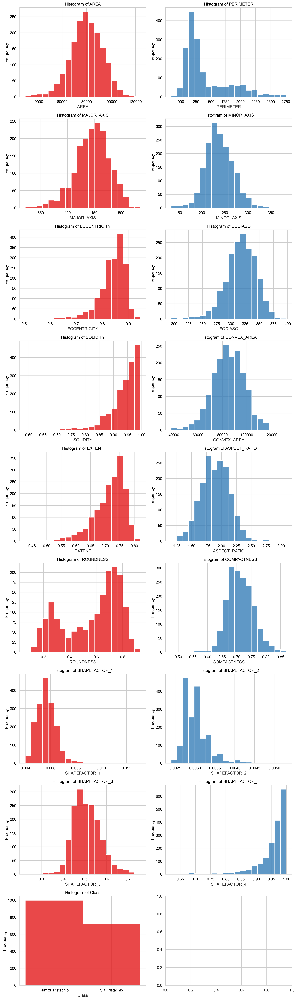

In [16]:
sns.set(style="whitegrid")
num_rows = len(df.columns)
num_columns = 2  # You can adjust the number of columns per row
fig, axes = plt.subplots(num_rows // num_columns + (num_rows % num_columns > 0), num_columns, figsize=(12, 40), dpi=300)

colors = sns.color_palette("Set1", num_columns)
label_color = 'black'
title_color = 'black'

for i, column in enumerate(df.columns):
    row = i // num_columns
    col = i % num_columns
    
    sns.histplot(data=df[column], ax=axes[row, col], color=colors[col], alpha=0.8, bins=20)
    axes[row, col].set_ylabel('Frequency', color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Histogram of {column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    fig.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust the spacing

# Turn off any empty subplots
for i in range(len(df.columns), num_rows):
    row = i // num_columns
    col = i % num_columns
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


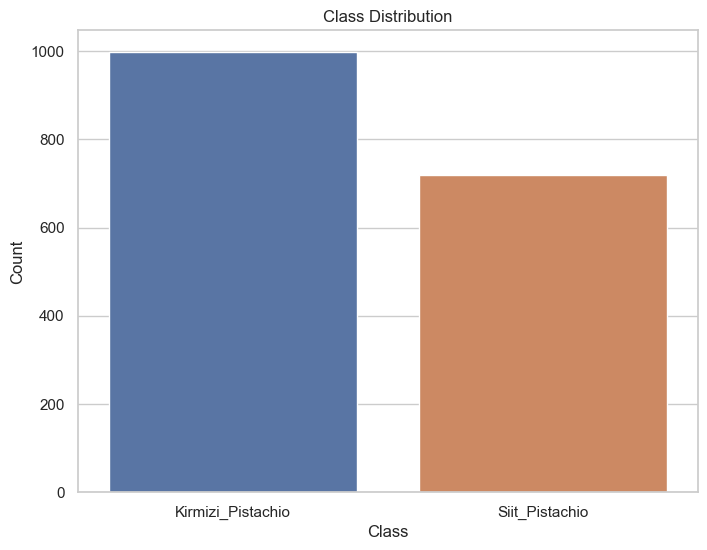

In [17]:
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))

# Create a bar plot for the 'Class' column
sns.countplot(data=df, x='Class')

plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

plt.show()

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Scatter Plots</h2>
</div>

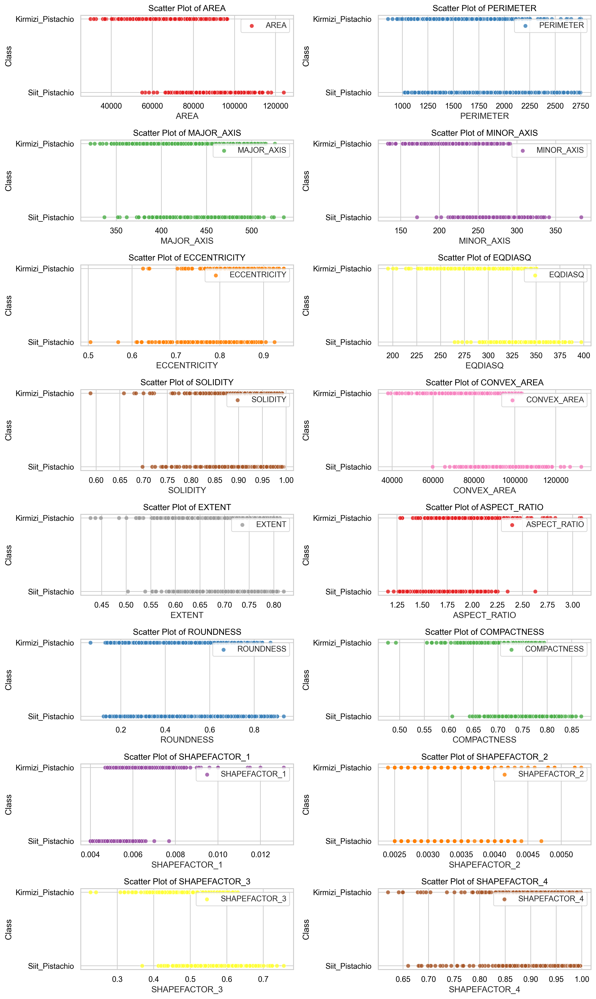

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
sns.set(style="whitegrid")
num_columns = 2
num_rows = (len(columns) + num_columns - 1) // num_columns  # Calculate the number of rows needed
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 20), dpi=300)

colors = sns.color_palette("Set1", len(columns))
label_color = 'black'
title_color = 'black'

for i, column in enumerate(columns):
    row = i // num_columns
    col = i % num_columns
    
    sns.scatterplot(data=df, x=column, y='Class', ax=axes[row, col], color=colors[i], alpha=0.8, label=column)
    axes[row, col].set_ylabel('Class', color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Scatter Plot of {column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4, hspace=0.6)

if len(columns) % num_columns != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">KDE Plots</h2>
</div>

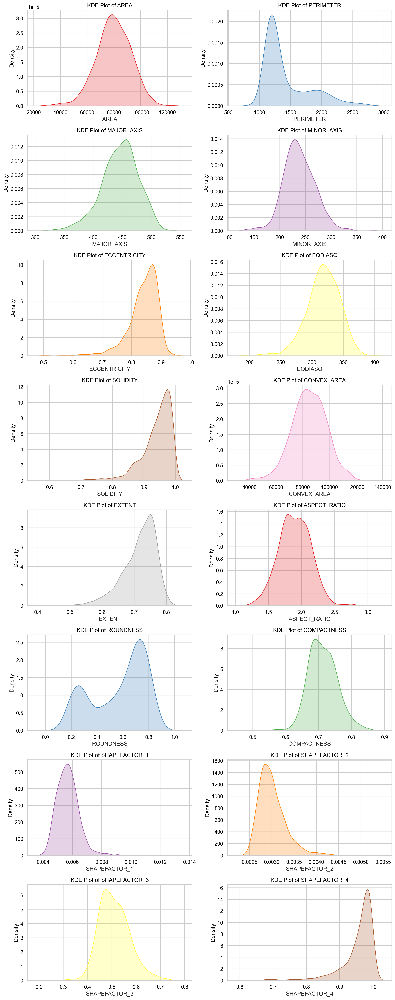

In [19]:
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 30), dpi=300)

for i, column in enumerate(columns):
    row = i // 2
    col = i % 2
    
    sns.kdeplot(data=df[column], ax=axes[row, col], color=colors[i], fill=True, legend=False)
    axes[row, col].set_ylabel('Density', color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'KDE Plot of {column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4)

if num_columns % 2 != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Density Heatmaps</h2>
</div>

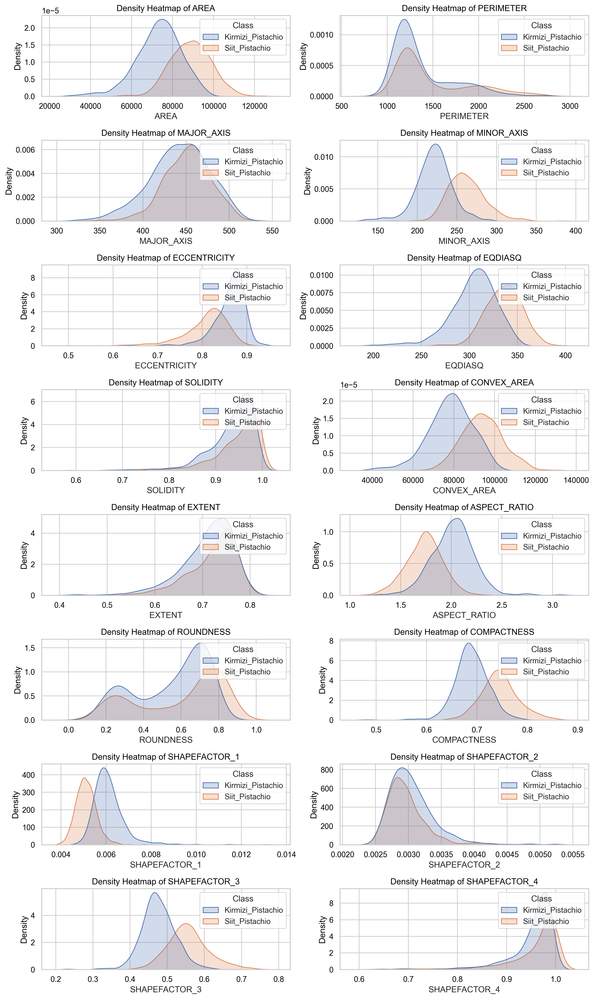

In [20]:
sns.set(style="whitegrid")

# Specify the list of columns for which you want to create density heatmaps
columns_to_plot = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY', 'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA',
                   'EXTENT', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2', 'SHAPEFACTOR_3',
                   'SHAPEFACTOR_4']

num_columns = 2
num_rows = (len(columns_to_plot) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 20), dpi=300)

label_color = 'black'
title_color = 'black'

for i, column in enumerate(columns_to_plot):
    row = i // num_columns
    col = i % num_columns
    
    sns.kdeplot(data=df, x=column, hue='Class', fill=True, ax=axes[row, col])
    axes[row, col].set_ylabel('Density', color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Density Heatmap of {column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4, hspace=0.6)

if len(columns_to_plot) % num_columns != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Calculating Statistical Mean</h2>
</div>

In [21]:
# Are the mean values the same for each class? Two sample, two polulations independen t t-test
#
# H0: mean_class1 = mean_class2?
# H1: mean_class1 != mean_class2

In [22]:
def compare_means_by_class(df):
    column_comparison = {}
    columns_to_exclude = ["Class"]
    
    for column in df.columns:
        if column not in columns_to_exclude:
            means_by_class = df.groupby(["Class"])[column].mean()
            means_equal = means_by_class.nunique() == 1
            column_comparison[column] = {"MeansEqual": means_equal, "MeansByClass": means_by_class}
    return column_comparison

column_comparison = compare_means_by_class(df)

for column, comparison in column_comparison.items():
    print(f"Column: '{column}'")
    if comparison["MeansEqual"]:
        print("Mean values are the same for all classes.")
    else:
        print("Mean values are different for different classes.")
    print("Mean values by class:")
    print(comparison["MeansByClass"])
    print("-" * 50)

Column: 'AREA'
Mean values are different for different classes.
Mean values by class:
Class
Kirmizi_Pistachio    73313.372745
Siit_Pistachio       88962.873611
Name: AREA, dtype: float64
--------------------------------------------------
Column: 'PERIMETER'
Mean values are different for different classes.
Mean values by class:
Class
Kirmizi_Pistachio    1373.454453
Siit_Pistachio       1488.806545
Name: PERIMETER, dtype: float64
--------------------------------------------------
Column: 'MAJOR_AXIS'
Mean values are different for different classes.
Mean values by class:
Class
Kirmizi_Pistachio    442.246146
Siit_Pistachio       451.695857
Name: MAJOR_AXIS, dtype: float64
--------------------------------------------------
Column: 'MINOR_AXIS'
Mean values are different for different classes.
Mean values by class:
Class
Kirmizi_Pistachio    221.000607
Siit_Pistachio       262.023873
Name: MINOR_AXIS, dtype: float64
--------------------------------------------------
Column: 'ECCENTRICITY'
M

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Violin Plots</h2>
</div>

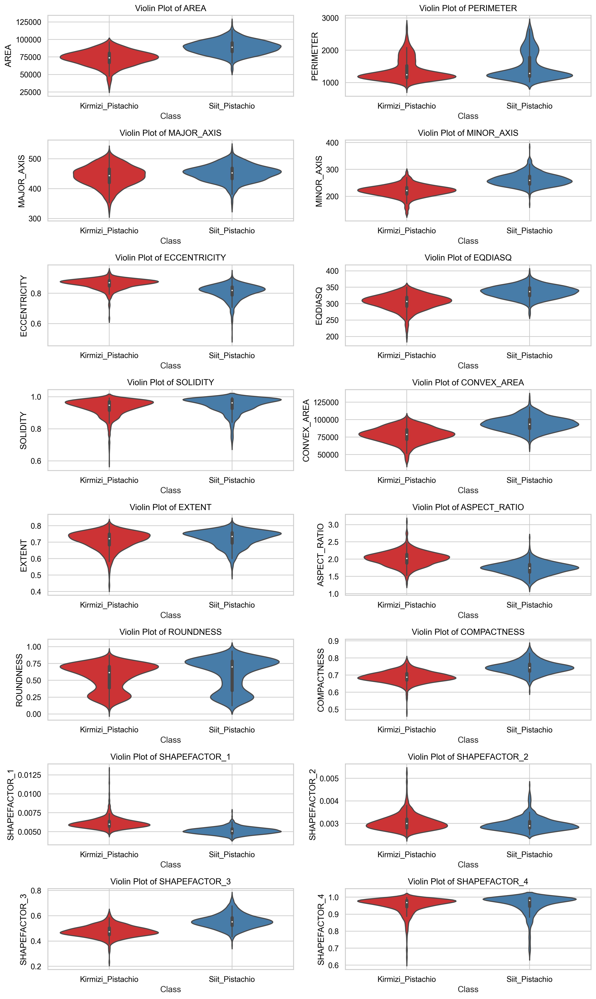

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
sns.set(style="whitegrid")
columns_to_plot = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY', 'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA',
                   'EXTENT', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2', 'SHAPEFACTOR_3',
                   'SHAPEFACTOR_4']

num_columns = 2
num_rows = (len(columns_to_plot) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 20), dpi=300)

label_color = 'black'
title_color = 'black'

for i, column in enumerate(columns_to_plot):
    row = i // num_columns
    col = i % num_columns
    
    sns.violinplot(data=df, x='Class', y=column, ax=axes[row, col], palette='Set1')
    axes[row, col].set_ylabel(column, color=label_color)
    axes[row, col].yaxis.label.set_color(label_color)
    axes[row, col].set_title(f'Violin Plot of {column}', color=title_color)
    
    axes[row, col].tick_params(axis='x', colors=label_color)
    axes[row, col].tick_params(axis='y', colors=label_color)
    axes[row, col].title.set_color(title_color)
    axes[row, col].grid(True)
    
    fig.subplots_adjust(wspace=0.4, hspace=0.6)

if len(columns_to_plot) % num_columns != 0:
    axes[-1, -1].axis('off')

plt.tight_layout()
plt.show()


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Correlation Heatmap</h2>
</div>

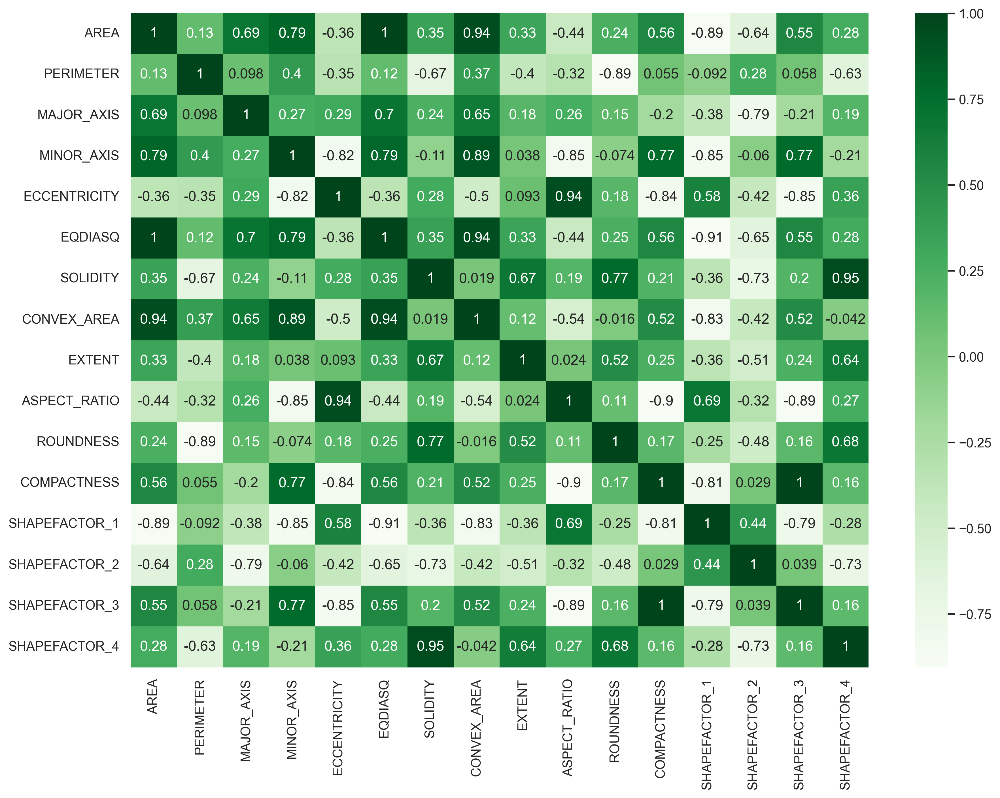

In [24]:
df2 = df.drop('Class', axis=1)
df_corr = df2.corr()
plt.figure(figsize = (14, 10), dpi = 300)
sns.heatmap(df_corr,annot = True, cmap='Greens')
plt.show()

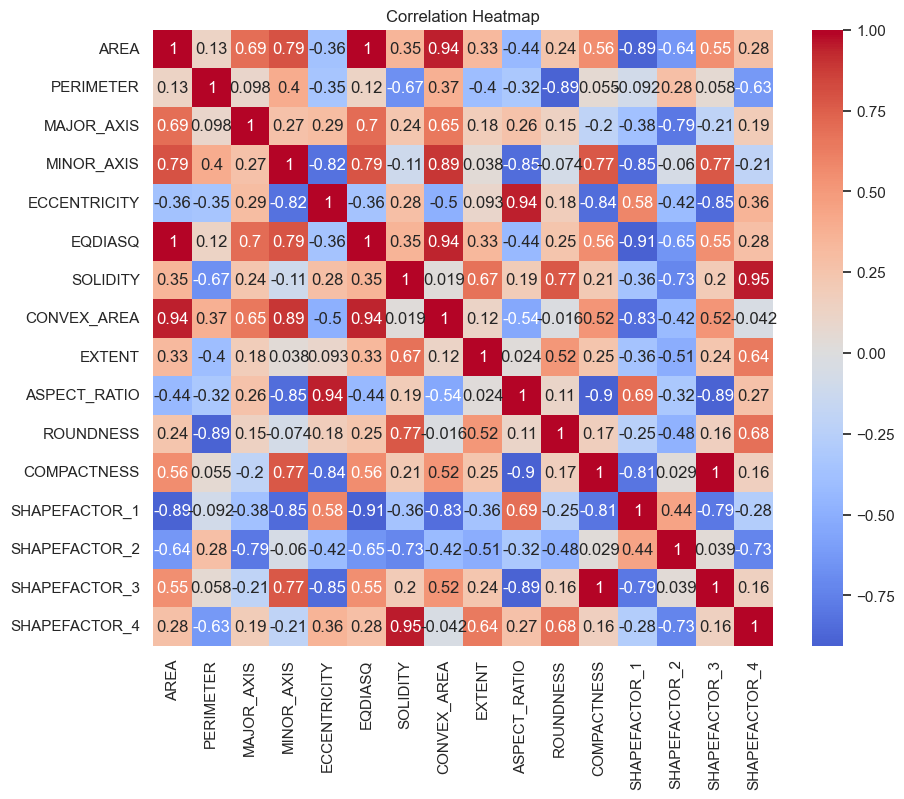

In [25]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


sns.set(style="white")

# Compute the correlation matrix
corr_matrix = df2.corr()

plt.figure(figsize=(10, 8))

# Create a correlation heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)

plt.title('Correlation Heatmap')
plt.show()

<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Columns to drop</h2>
</div>

### Selecting columns based on correlation heatmap

In [26]:
corr_matrix = df2.corr().abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
THRESHOLD = 0.90
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > THRESHOLD)]
print('Feature(s) to drop:', ', '.join(to_drop))

clean_df = df.drop(to_drop, axis=1)

print('Number of features before selection:', df.shape[1])
print('Number of features after selection:', clean_df.shape[1])

Feature(s) to drop: EQDIASQ, CONVEX_AREA, ASPECT_RATIO, SHAPEFACTOR_1, SHAPEFACTOR_3, SHAPEFACTOR_4
Number of features before selection: 17
Number of features after selection: 11


### Selecting columns based on Box plot, Scater plot and Density heatmap observations

In [27]:
df_clean2 = df.drop(['PERIMETER', 'MAJOR_AXIS', 'SOLIDITY', 'EXTENT', 'ROUNDNESS', 'SHAPEFACTOR_2', 'SHAPEFACTOR_4'], axis=1)
print('Number of features before selection:', df.shape[1])
print('Number of features after selection:', df_clean2.shape[1])

Number of features before selection: 17
Number of features after selection: 10


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">My New Cleaned and Updated DF</h2>
</div>

In [28]:
clean_df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,SOLIDITY,EXTENT,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_2,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,0.9424,0.7710,0.6806,0.6896,0.0030,Kirmizi_Pistachio
1,89272,1173.1810,460.2551,251.9546,0.8369,0.9641,0.7584,0.8151,0.7325,0.0028,Siit_Pistachio
2,60955,999.7890,386.9247,209.1255,0.8414,0.9465,0.7263,0.7663,0.7200,0.0034,Kirmizi_Pistachio
3,79537,1439.5129,466.7973,221.2136,0.8806,0.9437,0.7568,0.4823,0.6817,0.0028,Kirmizi_Pistachio
4,96395,1352.6740,515.8730,246.5945,0.8784,0.9549,0.7428,0.6620,0.6791,0.0026,Kirmizi_Pistachio


In [29]:
df_clean2.head()

,AREA,MINOR_AXIS,ECCENTRICITY,EQDIASQ,CONVEX_AREA,ASPECT_RATIO,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_3,Class
0,73107,217.7261,0.8705,305.0946,77579,2.0319,0.6896,0.0061,0.4756,Kirmizi_Pistachio
1,89272,251.9546,0.8369,337.1419,92598,1.8267,0.7325,0.0052,0.5366,Siit_Pistachio
2,60955,209.1255,0.8414,278.5863,64400,1.8502,0.7200,0.0063,0.5184,Kirmizi_Pistachio
3,79537,221.2136,0.8806,318.2289,84281,2.1102,0.6817,0.0059,0.4648,Kirmizi_Pistachio
4,96395,246.5945,0.8784,350.3340,100950,2.0920,0.6791,0.0054,0.4612,Kirmizi_Pistachio


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">One last step, let's encode the 'Class' Column so the whole df is numerical</h2>
</div>

In [30]:
encoder = LabelEncoder()
clean_df['Class'] = encoder.fit_transform(df['Class'])

labels = dict(zip(encoder.transform(encoder.classes_), encoder.classes_))
print(labels)

path_of_file = '/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Encoders/'
with open(path_of_file + 'encoder.pkl', 'wb') as encoder_file:
    pickle.dump(encoder, encoder_file)

{0: 'Kirmizi_Pistachio', 1: 'Siit_Pistachio'}


In [31]:
encoder2 = LabelEncoder()
df_clean2['Class'] = encoder.fit_transform(df['Class'])

labels = dict(zip(encoder.transform(encoder.classes_), encoder.classes_))
print(labels)

path_of_file = '/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Encoders/'
with open(path_of_file + 'encoder2.pkl', 'wb') as encoder_file:
    pickle.dump(encoder2, encoder_file)

{0: 'Kirmizi_Pistachio', 1: 'Siit_Pistachio'}


In [32]:
clean_df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,SOLIDITY,EXTENT,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_2,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,0.9424,0.7710,0.6806,0.6896,0.0030,0
1,89272,1173.1810,460.2551,251.9546,0.8369,0.9641,0.7584,0.8151,0.7325,0.0028,1
2,60955,999.7890,386.9247,209.1255,0.8414,0.9465,0.7263,0.7663,0.7200,0.0034,0
3,79537,1439.5129,466.7973,221.2136,0.8806,0.9437,0.7568,0.4823,0.6817,0.0028,0
4,96395,1352.6740,515.8730,246.5945,0.8784,0.9549,0.7428,0.6620,0.6791,0.0026,0


In [33]:
df_clean2.head()

,AREA,MINOR_AXIS,ECCENTRICITY,EQDIASQ,CONVEX_AREA,ASPECT_RATIO,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_3,Class
0,73107,217.7261,0.8705,305.0946,77579,2.0319,0.6896,0.0061,0.4756,0
1,89272,251.9546,0.8369,337.1419,92598,1.8267,0.7325,0.0052,0.5366,1
2,60955,209.1255,0.8414,278.5863,64400,1.8502,0.7200,0.0063,0.5184,0
3,79537,221.2136,0.8806,318.2289,84281,2.1102,0.6817,0.0059,0.4648,0
4,96395,246.5945,0.8784,350.3340,100950,2.0920,0.6791,0.0054,0.4612,0


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">SMOTE & Upsampling</h2>
</div>

## Dataset 1

### SMOTE

In [34]:
# Separate features and target variable
X = clean_df.drop("Class", axis=1)  # Features
y = clean_df["Class"]  # Target variable

# Count the class distribution before applying SMOTE
print("Class distribution before SMOTE:", Counter(y))

# Instantiate the SMOTE technique
smote = SMOTE(random_state=42)

# Apply SMOTE to the dataset
X_resampled, y_resampled = smote.fit_resample(X, y)

# Count the class distribution after applying SMOTE
print("Class distribution after SMOTE:", Counter(y_resampled))

# Create a new DataFrame with the resampled data
resampled_clean_df = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name="Class")], axis=1)

Class distribution before SMOTE: Counter({0: 998, 1: 720})
Class distribution after SMOTE: Counter({0: 998, 1: 998})


In [35]:
print(clean_df.shape)
print(resampled_clean_df.shape)

(1718, 11)
(1996, 11)


In [36]:
print(clean_df['Class'].value_counts())
print(resampled_clean_df['Class'].value_counts())

Class
0    998
1    720
Name: count, dtype: int64
Class
0    998
1    998
Name: count, dtype: int64


### Upsampling

In [37]:
# Separate features and target variable
X1 = clean_df.drop("Class", axis=1)  # Features
y1 = clean_df["Class"]  # Target variable

# Count the class distribution before upsampling
print("Class distribution before upsampling:", Counter(y1))

# Combine the features and target variable for upsampling
upsample_df = pd.concat([X1, y1], axis=1)

# Split the data into majority and minority classes
majority_class = upsample_df[upsample_df["Class"] == 0]
minority_class = upsample_df[upsample_df["Class"] == 1]

# Upsample the minority class
upsampled_minority = resample(minority_class, replace=True, n_samples=len(majority_class), random_state=42)

# Combine the majority class with the upsampled minority class
upsampled_cleandf = pd.concat([majority_class, upsampled_minority])

# Count the class distribution after upsampling
print("Class distribution after upsampling:", Counter(upsampled_cleandf["Class"]))

Class distribution before upsampling: Counter({0: 998, 1: 720})
Class distribution after upsampling: Counter({0: 998, 1: 998})


In [38]:
print(clean_df.shape)
print(upsampled_cleandf.shape)

(1718, 11)
(1996, 11)


In [39]:
print(clean_df['Class'].value_counts())
print(upsampled_cleandf['Class'].value_counts())

Class
0    998
1    720
Name: count, dtype: int64
Class
0    998
1    998
Name: count, dtype: int64


## Dataset 2

### SMOTE

In [40]:
# Separate features and target variable
X2 = df_clean2.drop("Class", axis=1)  # Features
y2 = df_clean2["Class"]  # Target variable

# Count the class distribution before applying SMOTE
print("Class distribution before SMOTE:", Counter(y2))

# Instantiate the SMOTE technique
smote2 = SMOTE(random_state=42)

# Apply SMOTE to the dataset
X_resampled2, y_resampled2 = smote.fit_resample(X2, y2)

# Count the class distribution after applying SMOTE
print("Class distribution after SMOTE:", Counter(y_resampled2))

# Create a new DataFrame with the resampled data
resampled_dfclean2 = pd.concat([pd.DataFrame(X_resampled2, columns=X2.columns), pd.Series(y_resampled2, name="Class")], axis=1)

Class distribution before SMOTE: Counter({0: 998, 1: 720})
Class distribution after SMOTE: Counter({0: 998, 1: 998})


In [41]:
print(df_clean2.shape)
print(resampled_dfclean2.shape)

(1718, 10)
(1996, 10)


In [42]:
print(df_clean2['Class'].value_counts())
print(resampled_dfclean2['Class'].value_counts())

Class
0    998
1    720
Name: count, dtype: int64
Class
0    998
1    998
Name: count, dtype: int64


### Upsampling

In [43]:
# Separate features and target variable
X3 = df_clean2.drop("Class", axis=1)  # Features
y3 = df_clean2["Class"]  # Target variable

# Count the class distribution before upsampling
print("Class distribution before upsampling:", Counter(y3))

# Combine the features and target variable for upsampling
upsample_df3 = pd.concat([X3, y3], axis=1)

# Split the data into majority and minority classes
majority_class3 = upsample_df3[upsample_df3["Class"] == 0]
minority_class3 = upsample_df3[upsample_df3["Class"] == 1]

# Upsample the minority class
upsampled_minority3 = resample(minority_class3, replace=True, n_samples=len(majority_class3), random_state=42)

# Combine the majority class with the upsampled minority class
upsampled_dfclean2 = pd.concat([majority_class3, upsampled_minority3])

# Count the class distribution after upsampling
print("Class distribution after upsampling:", Counter(upsampled_dfclean2["Class"]))

Class distribution before upsampling: Counter({0: 998, 1: 720})
Class distribution after upsampling: Counter({0: 998, 1: 998})


In [44]:
print(df_clean2.shape)
print(upsampled_dfclean2.shape)

(1718, 10)
(1996, 10)


In [45]:
print(df_clean2['Class'].value_counts())
print(upsampled_dfclean2['Class'].value_counts())

Class
0    998
1    720
Name: count, dtype: int64
Class
0    998
1    998
Name: count, dtype: int64


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Concatenating SMOTE & Upsampled Dataframes</h2>
</div>

### Dataset 1

In [46]:
# Reset index of both DataFrames
resampled_clean_df.reset_index(drop=True, inplace=True)
upsampled_cleandf.reset_index(drop=True, inplace=True)

# Concatenate the DataFrames along axis 1
data1clean = pd.concat([resampled_clean_df, upsampled_cleandf], axis=0)

# Display the shape of the new DataFrame
print("Shape of dataset1clean:", data1clean.shape)

Shape of dataset1clean: (3992, 11)


In [47]:
data1clean.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,SOLIDITY,EXTENT,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_2,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,0.9424,0.7710,0.6806,0.6896,0.0030,0
1,89272,1173.1810,460.2551,251.9546,0.8369,0.9641,0.7584,0.8151,0.7325,0.0028,1
2,60955,999.7890,386.9247,209.1255,0.8414,0.9465,0.7263,0.7663,0.7200,0.0034,0
3,79537,1439.5129,466.7973,221.2136,0.8806,0.9437,0.7568,0.4823,0.6817,0.0028,0
4,96395,1352.6740,515.8730,246.5945,0.8784,0.9549,0.7428,0.6620,0.6791,0.0026,0


### Dataset 2

In [48]:
# Reset index of both DataFrames
resampled_dfclean2.reset_index(drop=True, inplace=True)
upsampled_dfclean2.reset_index(drop=True, inplace=True)

# Concatenate the DataFrames along axis 1
data2clean = pd.concat([resampled_dfclean2, upsampled_dfclean2], axis=0)

# Display the shape of the new DataFrame
print("Shape of dataset1clean:", data2clean.shape)

Shape of dataset1clean: (3992, 10)


In [49]:
data2clean.head()

,AREA,MINOR_AXIS,ECCENTRICITY,EQDIASQ,CONVEX_AREA,ASPECT_RATIO,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_3,Class
0,73107,217.7261,0.8705,305.0946,77579,2.0319,0.6896,0.0061,0.4756,0
1,89272,251.9546,0.8369,337.1419,92598,1.8267,0.7325,0.0052,0.5366,1
2,60955,209.1255,0.8414,278.5863,64400,1.8502,0.7200,0.0063,0.5184,0
3,79537,221.2136,0.8806,318.2289,84281,2.1102,0.6817,0.0059,0.4648,0
4,96395,246.5945,0.8784,350.3340,100950,2.0920,0.6791,0.0054,0.4612,0


<div style="background-color: #D9EAD3; border-radius: 10px; border: 1px solid #D2B48C; padding: 10px;">
    <h2 style="color: #8B4513;">Finally, save my cleaned df</h2>
</div>

### Dataset 1

In [50]:
clean_df.to_csv('/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Data/Cleaned/clean_df.csv', index=False)  # Save without index

In [51]:
data1clean.to_csv('/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Data/Cleaned/data1clean.csv', index=False)

### Dataset 2

In [52]:
df_clean2.to_csv('/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Data/Cleaned/df_clean2', index=False)

In [53]:
data2clean.to_csv('/Users/jxhn/Desktop/IRONHACK/Week_9/Final_project/Data/Cleaned/data2clean.csv', index=False)